<font style="font-size:96px; font-weight:bolder; color:#0040a0"><img src="http://montage.ipac.caltech.edu/docs/M51_logo.png" alt="M" style="float: left; padding: 25px 30px 25px 0px;" /></font>

<i><b>Montage</b> Montage is an astronomical image toolkit with components for reprojection, background matching, coaddition and visualization of FITS files. It can be used as a set of command-line tools (Linux, OS X and Windows), C library calls (Linux and OS X) and as Python binary extension modules.

The Montage source is written in ANSI-C and code can be downloaded from GitHub ( https://github.com/Caltech-IPAC/Montage ). The Python package can be installed from PyPI ("pip install MontagePy"). The package has no external dependencies. See http://montage.ipac.caltech.edu/ for details on the design and applications of Montage.


# MontagePy.main modules: mAdd

The Montage modules are generally used as steps in a workflow to create a mosaic of a set of input images.  These steps are: determine the geometry of the mosaic on the sky, reproject the images to a common frame and spatial sampling; rectify the backgrounds to a common level, and coadd the images into a mosaic.  This page illustrates the use of one Montage module, mAdd, which does the final coaddition.

Visit <a href="Mosaic.ipynb">Building a Mosaic with Montage</a> to see how mAdd is used as part of a workflow to creage a mosaic (or the <a href="Mosaic_oneshot.ipynb"> one shot </a> version if you just want to see the commands).  See the complete list of Montage Notebooks <a href="http://montage.ipac.caltech.edu/MontageNotebooks">here</a>.

mAdd is the last step of the mosaicking process. It co-adds a set of reprojected (usually background-matched as well) FITS images to create the final mosaic.

The required inputs are the path to the images and the table of metadata describing them, the header template that describes the geometry of the output mosaic on the sky (which should match the headers in each image, except for integer pixel offsets), and the name of the output mosaic.

mAdd has additional controls to, <i>e.g.</i>, tell it whether to "shrink-wrap" the mosaic (remove empty border pixel areas) or override the default mean coaddition and instead return the median or the count of the input pixels.

In [1]:
from MontagePy.main import mAdd, mViewer

help(mAdd)

Help on built-in function mAdd in module MontagePy.main:

mAdd(...)
    mAdd coadds as set of images that have been reprojected to the same pixel framework into a final mosaic.
    
    Parameters
    ----------
    path : str
        Directory containing files to be coadded.
    tblfile : str
        Table file list of reprojected files to coadded.
    template_file : str
        FITS header file used to define the desired output.
    outfile : str
        Final mosaic FITS file.
    shrink : bool, optional
        Shrink-wrap to remove blank border areas.
    haveAreas : bool, optional
        Area files exist for weighting the coadd.
    coadd : int, optional
        Image stacking: 0(MEAN), 1(MEDIAN), 2(COUNT).
    debug : int, optional
        Debugging output level.
    
    
    Returns
    -------
    status : int
        Return status (0: OK, 1:ERROR).
    msg : str
        Return message (for errors).
    time : float
        Total processing time (sec).



## mAdd Example

Co-add a set of reoprojected, background rectified images of M17. The are available from http://montage.ipac.caltech.edu/data/montage_data.tar.gz (1 GByte uncompressed). Unpack in the same directories as the Juyper notebooks.

In [2]:
rtn = mAdd("M17/corrected", "M17/cimages.tbl", "M17/M17.hdr", "work/M17/mosaic.fits")

print(rtn)

{'status': '0', 'time': 2.0}


<p>&nbsp;<p/>
Here is one of the input (reprojected, background-matched) images:

{'status': '0', 'type': b'grayscale', 'nx': 513, 'ny': 1024, 'grayminval': 146.26332325927484, 'grayminpercent': 0.0, 'grayminsigma': -2.0, 'graymaxval': 10006.5115462375, 'graymaxpercent': 100.0, 'graymaxsigma': 1334.2638415582198, 'blueminval': 0.0, 'blueminpercent': 0.0, 'blueminsigma': 0.0, 'bluemaxval': 0.0, 'bluemaxpercent': 0.0, 'bluemaxsigma': 0.0, 'greenminval': 0.0, 'greenminpercent': 0.0, 'greenminsigma': 0.0, 'greenmaxval': 0.0, 'greenmaxpercent': 0.0, 'greenmaxsigma': 0.0, 'redminval': 0.0, 'redminpercent': 0.0, 'redminsigma': 0.0, 'redmaxval': 0.0, 'redmaxpercent': 0.0, 'redmaxsigma': 0.0, 'graydatamin': 152.41320609320312, 'graydatamax': 10006.5115462375, 'bdatamin': 0.0, 'bdatamax': 0.0, 'gdatamin': 0.0, 'gdatamax': 0.0, 'rdatamin': 0.0, 'rdatamax': 0.0, 'flipX': 0, 'flipY': 1, 'colortable': 1, 'bunit': b''}


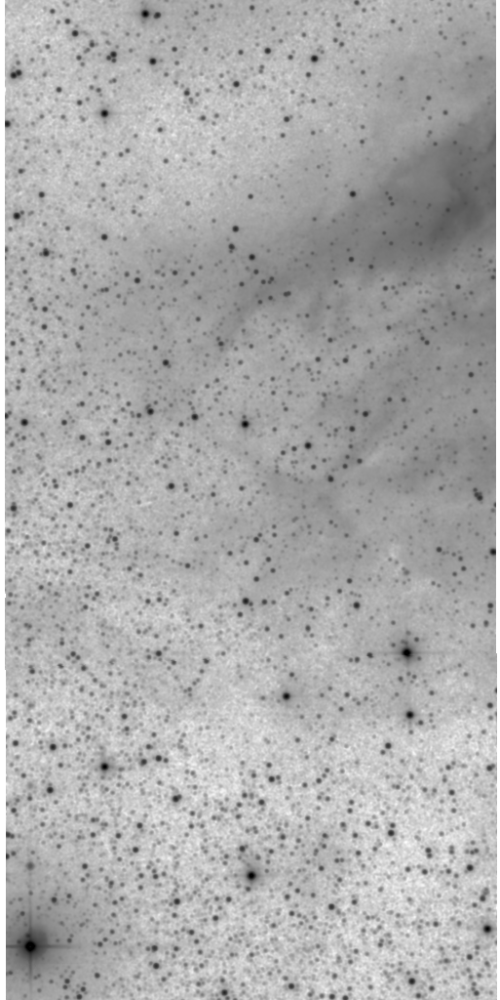

In [3]:
from IPython.display import Image

rtn = mViewer('-ct 1 -gray M17/corrected/hdu0_2mass-atlas-990502s-j1430080.fits \
              -2s max gaussian-log -out work/M17/hdu0_2mass-atlas-990502s-j1430080_add.png',
              '', mode=2)

print(rtn)

Image(filename='work/M17/hdu0_2mass-atlas-990502s-j1430080_add.png')

&nbsp;<p/>
and here is the mosaic (the above image contains the eastern part of the nebulosity):

{'status': '0', 'type': b'grayscale', 'nx': 3601, 'ny': 3600, 'grayminval': 149.5791825248529, 'grayminpercent': 0.0, 'grayminsigma': -2.0, 'graymaxval': 10639.0999189825, 'graymaxpercent': 100.0, 'graymaxsigma': 2240.4651757359084, 'blueminval': 0.0, 'blueminpercent': 0.0, 'blueminsigma': 0.0, 'bluemaxval': 0.0, 'bluemaxpercent': 0.0, 'bluemaxsigma': 0.0, 'greenminval': 0.0, 'greenminpercent': 0.0, 'greenminsigma': 0.0, 'greenmaxval': 0.0, 'greenmaxpercent': 0.0, 'greenmaxsigma': 0.0, 'redminval': 0.0, 'redminpercent': 0.0, 'redminsigma': 0.0, 'redmaxval': 0.0, 'redmaxpercent': 0.0, 'redmaxsigma': 0.0, 'graydatamin': 150.8148507701094, 'graydatamax': 10639.0999189825, 'bdatamin': 0.0, 'bdatamax': 0.0, 'gdatamin': 0.0, 'gdatamax': 0.0, 'rdatamin': 0.0, 'rdatamax': 0.0, 'flipX': 0, 'flipY': 1, 'colortable': 1, 'bunit': b''}


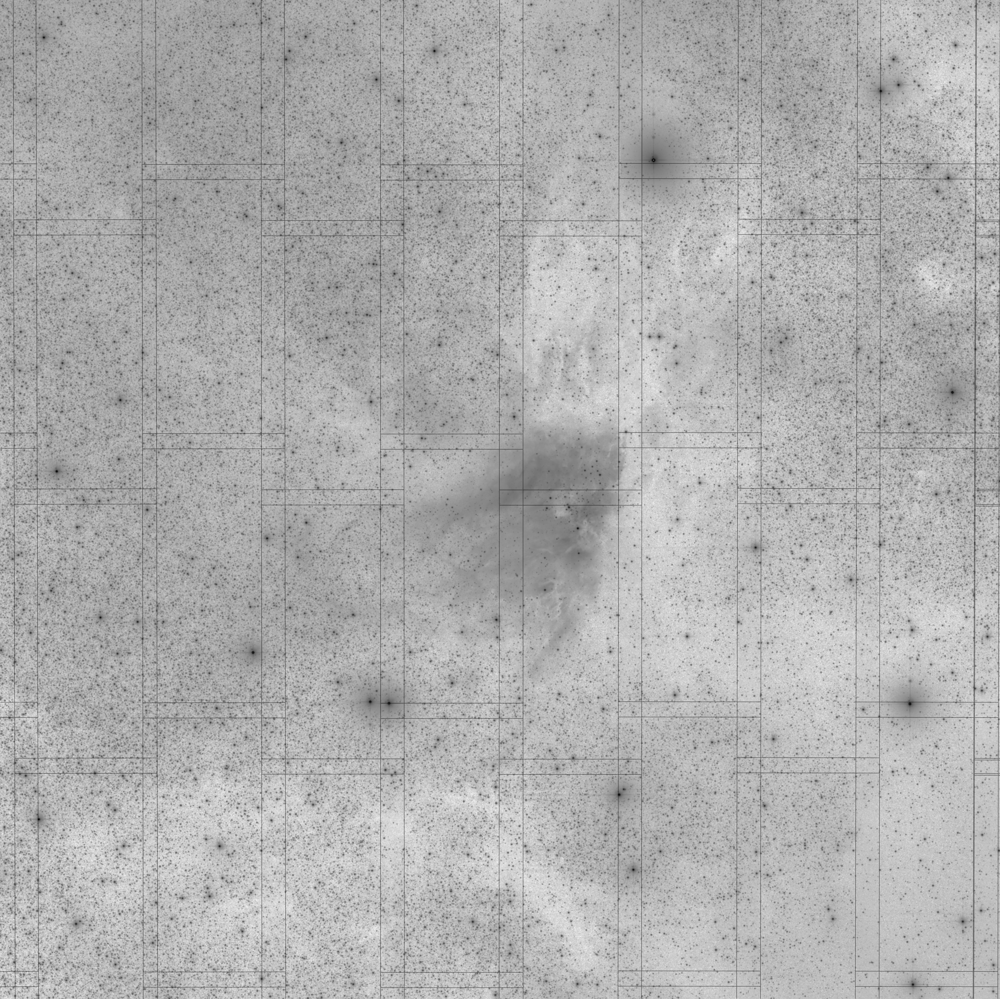

In [4]:
rtn = mViewer('-color black -imginfo M17/rimages.tbl \
              -ct 1 -gray M17/mosaic.fits -2s max gaussian-log \
              -out work/M17/mosaic_add.png',
              '', mode=2)

print(rtn)

Image(filename='work/M17/mosaic_add.png')

## mAdd Error Handling

If mAdd encounters an error, the return structure will just have two elements: a status of 1 ("error") and a message string that tries to diagnose the reason for the error.

For instance, if the user asks for a table that doesn't exist:

In [5]:
rtn = mAdd("M17/corrected", "M17/unknown.tbl", "M17/M17.hdr", "work/M17/mosaic.fits")

print(rtn)

{'status': '1', 'msg': b'Invalid image metadata file: M17/unknown.tbl'}


&nbsp;

## Classic Montage: mAdd as a Stand-Alone Program

### mAdd Unix/Windows Command-line Arguments

<p>mAdd can also be run as a command-line tool in Linux, OS X, and Windows:</p>

<p><tt>
<b>Usage:</b> mAdd [-d level] [-p imgdir] [-n(o-areas)] [-a mean|median|count] [-e(xact-size)] [-s statusfile] images.tbl template.hdr out.fits
</tt></p>
<p>&nbsp;</p>

## mAdd as a Library Call

<p>If you are writing in C/C++, mAdd can be accessed as a library function:</p>


<pre>
/*-***********************************************************************/
/*                                                                       */
/*  mAdd                                                                 */
/*                                                                       */
/*  Montage is a set of general reprojection / coordinate-transform /    */
/*  mosaicking programs.  Any number of input images can be merged into  */
/*  an output FITS file.  The attributes of the input are read from the  */
/*  input files; the attributes of the output are read a combination of  */
/*  the command line and a FITS header template file.                    */
/*                                                                       */
/*  This module, mAdd, reads sets of flux / area coverage images         */
/*  (the output of mProject) which have already been projected /         */
/*  resampled onto the same pixel space.  The fluxs, scaled by total     */
/*  input area, are then coadded into a single output composite.         */
/*                                                                       */
/*   char  *path           Directory containing files to be coadded      */
/*   char  *tblfile        Table file list of reprojected files to       */
/*                         coadd                                         */
/*   char  *template_file  FITS header file used to define the desired   */
/*                         output                                        */
/*   char  *outfile        Final mosaic FITS file                        */
/*                                                                       */
/*   int    shrink         Shrink-wrap to remove blank border areas      */
/*   int    haveAreas      Area files exist for weighting the coadd      */
/*   int    coadd          Image stacking: 0 (MEAN), 1 (MEDIAN)          */
/*                         2 (COUNT), 3 (SUM)                            */
/*                                                                       */
/*   int    debug          Debugging output level                        */
/*                                                                       */
/*************************************************************************/


struct mAddReturn *mAdd(char *path, char *tblfile, char *template_file, char *outfile,
                        int shrink, int haveAreas, int coadd, int debugin)
</pre>
<p><b>Return Structure</b></p>
<pre>
struct mAddReturn
{
   int    status;        // Return status (0: OK, 1:ERROR)
   char   msg [1024];    // Return message (for error return)
   char   json[4096];    // Return parameters as JSON string
   double time;          // Run time (sec)   
};
</pre>